In [2]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
plt.style.use('ggplot')

In [3]:
import pandas as pd

In [4]:
df = pd.read_csv("dataport-export_gas_oct2015-mar2016.csv")

In [5]:
df['dataid'].value_counts().to_numpy().mean()

10094.414012738853

In [6]:
df.head(20)

,localminute,dataid,meter_value
0,2015-10-01 00:00:10-05,739,88858
1,2015-10-01 00:00:13-05,8890,197164
2,2015-10-01 00:00:20-05,6910,179118
3,2015-10-01 00:00:22-05,3635,151318
4,2015-10-01 00:00:22-05,1507,390354
5,2015-10-01 00:00:29-05,5810,97506
6,2015-10-01 00:01:00-05,484,99298
7,2015-10-01 00:01:18-05,6910,179118
8,2015-10-01 00:01:34-05,6910,179118
9,2015-10-01 00:01:38-05,5810,97506


In [7]:
df.dtypes

localminute    object
dataid          int64
meter_value     int64
dtype: object

In [7]:
df.describe()

,dataid,meter_value
count,1.584823e+06,1.584823e+06
mean,4.352815e+03,2.015056e+05
std,2.941902e+03,1.351182e+05
min,3.500000e+01,2.829800e+04
25%,1.714000e+03,1.145800e+05
50%,4.031000e+03,1.670940e+05
75%,7.017000e+03,2.364940e+05
max,9.982000e+03,8.158240e+05


In [8]:
df['DST'] = pd.to_numeric(df['localminute'].str[-2:]) == 5

In [9]:
df['localminute'] = df['localminute'].str[:-3]

In [10]:
df['localminute'] = pd.to_datetime(df['localminute'], format='mixed').dt.strftime('%Y-%m-%d %H:%M:%S')

In [11]:
df['localminute'] = pd.to_datetime(df['localminute'])

In [12]:
df['year'] = df['localminute'].dt.year
df['month'] = df['localminute'].dt.month
df['day'] = df['localminute'].dt.day
df['hour'] = df['localminute'].dt.hour
df['minute'] = df['localminute'].dt.minute
df['second'] = df['localminute'].dt.second

In [13]:
df.head()

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second
0,2015-10-01 00:00:10,739,88858,True,2015,10,1,0,0,10
1,2015-10-01 00:00:13,8890,197164,True,2015,10,1,0,0,13
2,2015-10-01 00:00:20,6910,179118,True,2015,10,1,0,0,20
3,2015-10-01 00:00:22,3635,151318,True,2015,10,1,0,0,22
4,2015-10-01 00:00:22,1507,390354,True,2015,10,1,0,0,22


In [14]:
df['dataid'].value_counts()

dataid
2034    75991
6910    69349
484     44034
5814    42424
5810    42234
        ...  
7566       32
9620       23
4671       21
6101        3
4874        2
Name: count, Length: 157, dtype: int64

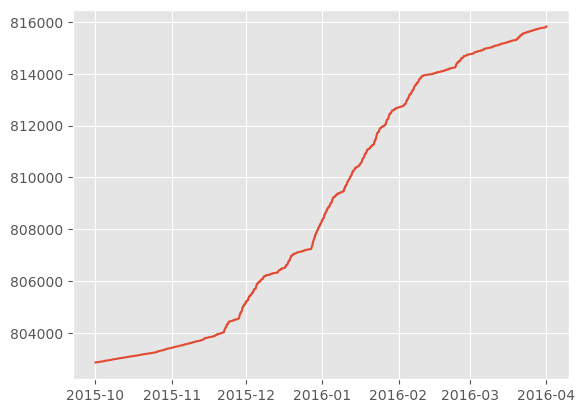

In [15]:
plt.plot(df[df['dataid'] == 5814].set_index("localminute")['meter_value'])

In [16]:
df[df['dataid'] == 2034]

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second
26,2015-10-01 00:03:02,2034,72376,True,2015,10,1,0,3,2
30,2015-10-01 00:04:18,2034,72376,True,2015,10,1,0,4,18
34,2015-10-01 00:05:18,2034,72376,True,2015,10,1,0,5,18
59,2015-10-01 00:09:47,2034,72376,True,2015,10,1,0,9,47
76,2015-10-01 00:12:48,2034,72376,True,2015,10,1,0,12,48
...,...,...,...,...,...,...,...,...,...,...
1584793,2016-03-31 23:54:13,2034,85364,True,2016,3,31,23,54,13
1584797,2016-03-31 23:54:57,2034,85364,True,2016,3,31,23,54,57
1584799,2016-03-31 23:55:42,2034,85364,True,2016,3,31,23,55,42
1584801,2016-03-31 23:56:12,2034,85364,True,2016,3,31,23,56,12


In [17]:
df = df.sort_values(by=['dataid', 'localminute'])

In [18]:
df['meter_value_diff'] = df.groupby('dataid')['meter_value'].diff()

In [19]:
df

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff
83,2015-10-01 00:14:44,35,93470,True,2015,10,1,0,14,44,NaN
244,2015-10-01 00:42:34,35,93470,True,2015,10,1,0,42,34,0.0
723,2015-10-01 02:02:37,35,93470,True,2015,10,1,2,2,37,0.0
790,2015-10-01 02:12:38,35,93470,True,2015,10,1,2,12,38,0.0
829,2015-10-01 02:20:36,35,93470,True,2015,10,1,2,20,36,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1561677,2016-03-28 09:25:54,9982,119734,True,2016,3,28,9,25,54,0.0
1562272,2016-03-28 11:29:41,9982,119736,True,2016,3,28,11,29,41,2.0
1567141,2016-03-29 04:38:38,9982,119784,True,2016,3,29,4,38,38,48.0
1577309,2016-03-30 17:46:42,9982,119852,True,2016,3,30,17,46,42,68.0


In [20]:
df[(df['dataid'] == 2449) & (df['meter_value'] > 190000)]

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff
606320,2015-12-07 16:55:33,2449,191126,False,2015,12,7,16,55,33,15878.0
606355,2015-12-07 17:02:33,2449,191126,False,2015,12,7,17,2,33,0.0
606467,2015-12-07 17:17:33,2449,191126,False,2015,12,7,17,17,33,15878.0
606785,2015-12-07 18:04:34,2449,191126,False,2015,12,7,18,4,34,0.0
606960,2015-12-07 18:28:34,2449,191126,False,2015,12,7,18,28,34,15876.0
...,...,...,...,...,...,...,...,...,...,...,...
656819,2015-12-12 22:10:39,2449,191296,False,2015,12,12,22,10,39,0.0
656973,2015-12-12 22:31:38,2449,191296,False,2015,12,12,22,31,38,0.0
657030,2015-12-12 22:38:39,2449,191296,False,2015,12,12,22,38,39,0.0
657500,2015-12-12 23:56:39,2449,191306,False,2015,12,12,23,56,39,15756.0


In [21]:
len(df['dataid'].unique())

157

In [22]:
df[(df['dataid'] == 1185) & (abs(df['meter_value_diff']) > 10000)]

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff
606383,2015-12-07 17:06:07,1185,162346,False,2015,12,7,17,6,7,17798.0
606487,2015-12-07 17:19:59,1185,144548,False,2015,12,7,17,19,59,-17798.0
606873,2015-12-07 18:16:16,1185,162348,False,2015,12,7,18,16,16,17800.0
606923,2015-12-07 18:21:50,1185,144550,False,2015,12,7,18,21,50,-17798.0
607575,2015-12-07 19:52:20,1185,162350,False,2015,12,7,19,52,20,17792.0
...,...,...,...,...,...,...,...,...,...,...,...
657142,2015-12-12 22:57:55,1185,144968,False,2015,12,12,22,57,55,-17438.0
657340,2015-12-12 23:31:10,1185,162406,False,2015,12,12,23,31,10,17438.0
657482,2015-12-12 23:53:49,1185,144968,False,2015,12,12,23,53,49,-17438.0
658081,2015-12-13 01:15:19,1185,162408,False,2015,12,13,1,15,19,17440.0


In [23]:
# for dataid, group in df[abs(df['meter_value_diff']) > 10000].groupby('dataid'):
#     plt.figure(figsize=(10, 5))
#     plt.scatter(group['localminute'], group['meter_value'], label=f'Meter {dataid}')
#     plt.xlabel('DateTime')
#     plt.ylabel('Meter Value Diff')
#     plt.title(f'Meter Value Diff ver Time for DataID {dataid}')
#     plt.legend()
#     plt.show()

In [24]:
df = df[~df['dataid'].isin(df[abs(df['meter_value_diff']) > 10000]['dataid'].unique())]   

In [25]:
df[abs(df['meter_value_diff']) > 10000]['dataid'].unique()

array([], dtype=int64)

In [26]:
df['dataid'].value_counts()

dataid
2034    75991
6910    69349
484     44034
5814    42424
5810    42234
        ...  
5545       33
7566       32
4671       21
6101        3
4874        2
Name: count, Length: 136, dtype: int64

In [27]:
df = df.set_index(df['dataid'])

In [28]:
df = df.drop([5545, 4874, 7566, 4671, 6101])

In [29]:
df

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff
dataid,,,,,,,,,,,
35,2015-10-01 00:14:44,35,93470,True,2015,10,1,0,14,44,NaN
35,2015-10-01 00:42:34,35,93470,True,2015,10,1,0,42,34,0.0
35,2015-10-01 02:02:37,35,93470,True,2015,10,1,2,2,37,0.0
35,2015-10-01 02:12:38,35,93470,True,2015,10,1,2,12,38,0.0
35,2015-10-01 02:20:36,35,93470,True,2015,10,1,2,20,36,0.0
...,...,...,...,...,...,...,...,...,...,...,...
9956,2016-01-15 12:18:15,9956,103332,False,2016,1,15,12,18,15,0.0
9956,2016-02-05 13:18:24,9956,106498,False,2016,2,5,13,18,24,3166.0
9956,2016-02-06 08:40:37,9956,106658,False,2016,2,6,8,40,37,160.0


In [30]:
df['dataid'].value_counts()

dataid
2034    75991
6910    69349
484     44034
5814    42424
5810    42234
        ...  
2645       74
9160       72
2755       68
2946       45
2814       37
Name: count, Length: 131, dtype: int64

In [31]:
time = "2015-10-01 10:52:52-05"
time[14:16]

'52'

In [32]:
df.corr() 

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff
localminute,1.000000,0.008772,0.034661,-0.221984,0.865823,-0.769483,0.146875,0.007871,0.000939,0.016792,0.006427
dataid,0.008772,1.000000,0.135166,-0.026534,0.005772,-0.004301,-0.000739,0.000885,0.000687,0.020954,0.003019
meter_value,0.034661,0.135166,1.000000,-0.011416,0.026802,-0.022675,0.007883,0.000752,-0.001119,-0.001732,0.005198
DST,-0.221984,-0.026534,-0.011416,1.000000,-0.164894,0.125082,0.159296,0.002934,-0.001236,-0.002130,-0.013281
year,0.865823,0.005772,0.026802,-0.164894,1.000000,-0.984387,-0.008704,0.002157,0.001144,0.024027,0.009274
month,-0.769483,-0.004301,-0.022675,0.125082,-0.984387,1.000000,0.002818,-0.002039,-0.001242,-0.025068,-0.009787
day,0.146875,-0.000739,0.007883,0.159296,-0.008704,0.002818,1.000000,0.001218,0.000106,-0.001208,0.000692
hour,0.007871,0.000885,0.000752,0.002934,0.002157,-0.002039,0.001218,1.000000,0.000193,0.000527,-0.002004
minute,0.000939,0.000687,-0.001119,-0.001236,0.001144,-0.001242,0.000106,0.000193,1.000000,-0.002486,-0.000161
second,0.016792,0.020954,-0.001732,-0.002130,0.024027,-0.025068,-0.001208,0.000527,-0.002486,1.000000,-0.002015


In [33]:
df = df[df['meter_value_diff'] > 0]

In [34]:
df[df['meter_value_diff'] < 0]

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff
dataid,,,,,,,,,,,


In [35]:
df.reset_index(drop=True, inplace=True)

In [36]:
# corr_dict = {}
# for dataid, group in df.groupby('dataid'):
#     corr_dict[dataid] = group.corr()

# # Check the result
# for dataid, corr_matrix in corr_dict.items():
#     print(f"Correlation matrix for dataid {dataid}:\n{corr_matrix}\n")

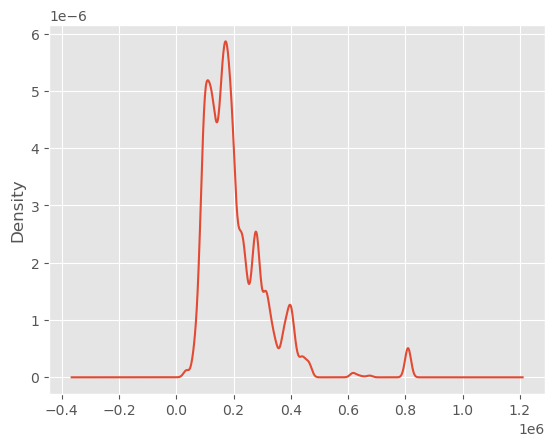

In [37]:
ax = df['meter_value'].plot(kind='kde')

In [38]:
df.describe()

,localminute,dataid,meter_value,year,month,day,hour,minute,second,meter_value_diff
count,273859,273859.00000,273859.000000,273859.000000,273859.000000,273859.000000,273859.000000,273859.000000,273859.000000,273859.000000
mean,2016-01-05 21:38:30.718278656,4363.51938,205948.813273,2015.571082,5.811345,15.805290,11.442878,29.627922,29.309305,9.441610
min,2015-10-01 00:27:33,35.00000,28304.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000
25%,2015-12-04 06:39:35,1718.00000,128278.000000,2015.000000,1.000000,8.000000,6.000000,15.000000,14.000000,2.000000
50%,2016-01-08 16:07:46,3893.00000,177632.000000,2016.000000,3.000000,16.000000,11.000000,30.000000,29.000000,4.000000
75%,2016-02-06 02:38:19,7017.00000,253618.000000,2016.000000,11.000000,24.000000,18.000000,45.000000,44.000000,8.000000
max,2016-03-31 23:59:17,9956.00000,815824.000000,2016.000000,12.000000,31.000000,23.000000,59.000000,59.000000,9860.000000
std,NaN,2929.63003,115631.710539,0.494922,4.811250,9.093623,6.726019,17.340598,17.342472,83.060546


In [39]:
df

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff
0,2015-10-01 06:23:36,35,93472,True,2015,10,1,6,23,36,2.0
1,2015-10-01 11:24:52,35,93474,True,2015,10,1,11,24,52,2.0
2,2015-10-01 17:03:44,35,93476,True,2015,10,1,17,3,44,2.0
3,2015-10-01 19:44:49,35,93482,True,2015,10,1,19,44,49,6.0
4,2015-10-01 21:13:46,35,93484,True,2015,10,1,21,13,46,2.0
...,...,...,...,...,...,...,...,...,...,...,...
273854,2016-01-15 11:50:02,9956,103332,False,2016,1,15,11,50,2,2.0
273855,2016-02-05 13:18:24,9956,106498,False,2016,2,5,13,18,24,3166.0
273856,2016-02-06 08:40:37,9956,106658,False,2016,2,6,8,40,37,160.0
273857,2016-02-08 06:24:20,9956,107002,False,2016,2,8,6,24,20,344.0


In [40]:
df['dayofweek'] = df['localminute'].dt.dayofweek
df['quarter'] = df['localminute'].dt.quarter
df['year'] = df['localminute'].dt.year
df['month'] = df['localminute'].dt.month
df['dayofyear'] = df['localminute'].dt.dayofyear
df['dayofmonth'] = df['localminute'].dt.day
df['weekofyear'] = df['localminute'].dt.isocalendar().week

/var/folders/tn/8lbbw7dn3f3b367scfqs7w3h0000gp/T/ipykernel_30013/3647965598.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['dayofweek'] = df['localminute'].dt.dayofweek
/var/folders/tn/8lbbw7dn3f3b367scfqs7w3h0000gp/T/ipykernel_30013/3647965598.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['quarter'] = df['localminute'].dt.quarter
/var/folders/tn/8lbbw7dn3f3b367scfqs7w3h0000gp/T/ipykernel_30013/3647965598.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a

In [41]:
df

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff,dayofweek,quarter,dayofyear,dayofmonth,weekofyear
0,2015-10-01 06:23:36,35,93472,True,2015,10,1,6,23,36,2.0,3,4,274,1,40
1,2015-10-01 11:24:52,35,93474,True,2015,10,1,11,24,52,2.0,3,4,274,1,40
2,2015-10-01 17:03:44,35,93476,True,2015,10,1,17,3,44,2.0,3,4,274,1,40
3,2015-10-01 19:44:49,35,93482,True,2015,10,1,19,44,49,6.0,3,4,274,1,40
4,2015-10-01 21:13:46,35,93484,True,2015,10,1,21,13,46,2.0,3,4,274,1,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273854,2016-01-15 11:50:02,9956,103332,False,2016,1,15,11,50,2,2.0,4,1,15,15,2
273855,2016-02-05 13:18:24,9956,106498,False,2016,2,5,13,18,24,3166.0,4,1,36,5,5
273856,2016-02-06 08:40:37,9956,106658,False,2016,2,6,8,40,37,160.0,5,1,37,6,5
273857,2016-02-08 06:24:20,9956,107002,False,2016,2,8,6,24,20,344.0,0,1,39,8,6


In [42]:
# for dataid, group in df.groupby('dataid'):
#     fig, ax = plt.subplots(figsize=(10, 8))
#     sns.boxplot(data=group, x='dayofweek', y='meter_value')
#     ax.set_title(f'meter value by Hour for dataid {dataid}')
#     plt.legend()
#     plt.show()

In [43]:
%pip install ydata-profiling

Note: you may need to restart the kernel to use updated packages.


In [44]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df)
profile.to_notebook_iframe

<bound method ProfileReport.to_notebook_iframe of >

In [45]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [46]:
df['time_elapsed'] = df.groupby('dataid')['localminute'].diff().dt.total_seconds()

/var/folders/tn/8lbbw7dn3f3b367scfqs7w3h0000gp/T/ipykernel_30013/3234697793.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['time_elapsed'] = df.groupby('dataid')['localminute'].diff().dt.total_seconds()


In [47]:
df

,localminute,dataid,meter_value,DST,year,month,day,hour,minute,second,meter_value_diff,dayofweek,quarter,dayofyear,dayofmonth,weekofyear,time_elapsed
0,2015-10-01 06:23:36,35,93472,True,2015,10,1,6,23,36,2.0,3,4,274,1,40,NaN
1,2015-10-01 11:24:52,35,93474,True,2015,10,1,11,24,52,2.0,3,4,274,1,40,18076.0
2,2015-10-01 17:03:44,35,93476,True,2015,10,1,17,3,44,2.0,3,4,274,1,40,20332.0
3,2015-10-01 19:44:49,35,93482,True,2015,10,1,19,44,49,6.0,3,4,274,1,40,9665.0
4,2015-10-01 21:13:46,35,93484,True,2015,10,1,21,13,46,2.0,3,4,274,1,40,5337.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273854,2016-01-15 11:50:02,9956,103332,False,2016,1,15,11,50,2,2.0,4,1,15,15,2,14390.0
273855,2016-02-05 13:18:24,9956,106498,False,2016,2,5,13,18,24,3166.0,4,1,36,5,5,1819702.0
273856,2016-02-06 08:40:37,9956,106658,False,2016,2,6,8,40,37,160.0,5,1,37,6,5,69733.0
273857,2016-02-08 06:24:20,9956,107002,False,2016,2,8,6,24,20,344.0,0,1,39,8,6,164623.0


In [48]:
df = df.fillna(0)

In [ ]:
X = df.drop(['localminute', 'meter_value'], axis=1)
X

,dataid,DST,year,month,day,hour,minute,second,meter_value_diff,dayofweek,quarter,dayofyear,dayofmonth,weekofyear,time_elapsed
0,35,True,2015,10,1,6,23,36,2.0,3,4,274,1,40,0.0
1,35,True,2015,10,1,11,24,52,2.0,3,4,274,1,40,18076.0
2,35,True,2015,10,1,17,3,44,2.0,3,4,274,1,40,20332.0
3,35,True,2015,10,1,19,44,49,6.0,3,4,274,1,40,9665.0
4,35,True,2015,10,1,21,13,46,2.0,3,4,274,1,40,5337.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273854,9956,False,2016,1,15,11,50,2,2.0,4,1,15,15,2,14390.0
273855,9956,False,2016,2,5,13,18,24,3166.0,4,1,36,5,5,1819702.0
273856,9956,False,2016,2,6,8,40,37,160.0,5,1,37,6,5,69733.0
273857,9956,False,2016,2,8,6,24,20,344.0,0,1,39,8,6,164623.0


In [50]:
y = df['meter_value_diff'].shift(-1)
y

0            2.0
1            2.0
2            6.0
3            2.0
4            2.0
           ...  
273854    3166.0
273855     160.0
273856     344.0
273857      40.0
273858       NaN
Name: meter_value_diff, Length: 273859, dtype: float64

In [68]:
y.dropna(inplace=True)

In [69]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

In [70]:
X.drop(df.tail(1).index,inplace=True)

KeyError: '[273858] not found in axis'

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [72]:
X_train

,dataid,DST,year,month,day,hour,minute,second,meter_value_diff,dayofweek,quarter,dayofyear,dayofmonth,weekofyear,time_elapsed
130562,3723,False,2016,1,16,6,9,38,8.0,5,1,16,16,2,1319.0
78516,1801,False,2016,1,5,21,1,31,4.0,1,1,5,5,1,3056.0
63451,1714,False,2016,1,12,2,33,46,4.0,1,1,12,12,2,1046.0
123383,3577,True,2015,10,29,2,58,11,2.0,3,4,302,29,44,3715.0
12178,252,True,2015,10,4,18,30,36,2.0,6,4,277,4,40,12960.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119879,3527,False,2015,12,22,4,36,7,2.0,1,4,356,22,52,16085.0
259178,9121,False,2016,2,23,9,49,40,2.0,1,1,54,23,8,1027.0
131932,3778,False,2015,11,16,18,39,20,2.0,0,4,320,16,47,1329.0
146867,4373,True,2015,10,18,17,10,39,2.0,6,4,291,18,42,21480.0


2

In [73]:
X_test

,dataid,DST,year,month,day,hour,minute,second,meter_value_diff,dayofweek,quarter,dayofyear,dayofmonth,weekofyear,time_elapsed
145843,4356,False,2015,11,28,13,38,57,42.0,5,4,332,28,48,9539.0
194393,6673,True,2016,3,20,22,4,8,16.0,6,1,80,20,11,30621.0
230621,7794,False,2016,2,16,17,3,48,2.0,1,1,47,16,7,4741.0
47763,1283,True,2016,3,23,11,56,50,6.0,2,1,83,23,12,3165.0
160890,5131,True,2016,3,13,9,16,54,4.0,6,1,73,13,10,419.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35732,871,False,2016,1,12,8,17,1,6.0,1,1,12,12,2,594.0
212439,7287,False,2016,1,21,7,23,58,4.0,3,1,21,21,3,405.0
136154,3893,False,2016,1,17,21,23,28,8.0,6,1,17,17,2,1066.0
29857,739,False,2016,1,14,4,42,35,6.0,3,1,14,14,2,2125.0


In [74]:
y_train

130562     2.0
78516      4.0
63451      6.0
123383     2.0
12178      2.0
          ... 
119879     4.0
259178     8.0
131932     4.0
146867    10.0
121958     2.0
Name: meter_value_diff, Length: 219086, dtype: float64

In [76]:
def introduce_missing_values(data, missing_percentage=0.1):
    data_with_missing = data.copy()
    n_missing = int(np.floor(missing_percentage * data_with_missing.shape[0]))
    missing_indices = np.random.choice(data_with_missing.index, n_missing, replace=False)
    data_with_missing.loc[missing_indices, 'meter_value_diff'] = np.nan
    return data_with_missing

In [77]:
X_test = introduce_missing_values(X_test)
X_test

,dataid,DST,year,month,day,hour,minute,second,meter_value_diff,dayofweek,quarter,dayofyear,dayofmonth,weekofyear,time_elapsed
145843,4356,False,2015,11,28,13,38,57,42.0,5,4,332,28,48,9539.0
194393,6673,True,2016,3,20,22,4,8,NaN,6,1,80,20,11,30621.0
230621,7794,False,2016,2,16,17,3,48,2.0,1,1,47,16,7,4741.0
47763,1283,True,2016,3,23,11,56,50,6.0,2,1,83,23,12,3165.0
160890,5131,True,2016,3,13,9,16,54,4.0,6,1,73,13,10,419.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35732,871,False,2016,1,12,8,17,1,6.0,1,1,12,12,2,594.0
212439,7287,False,2016,1,21,7,23,58,NaN,3,1,21,21,3,405.0
136154,3893,False,2016,1,17,21,23,28,8.0,6,1,17,17,2,1066.0
29857,739,False,2016,1,14,4,42,35,6.0,3,1,14,14,2,2125.0


In [79]:
X_test.fillna(-1, inplace=True)
X_test

,dataid,DST,year,month,day,hour,minute,second,meter_value_diff,dayofweek,quarter,dayofyear,dayofmonth,weekofyear,time_elapsed
145843,4356,False,2015,11,28,13,38,57,42.0,5,4,332,28,48,9539.0
194393,6673,True,2016,3,20,22,4,8,-1.0,6,1,80,20,11,30621.0
230621,7794,False,2016,2,16,17,3,48,2.0,1,1,47,16,7,4741.0
47763,1283,True,2016,3,23,11,56,50,6.0,2,1,83,23,12,3165.0
160890,5131,True,2016,3,13,9,16,54,4.0,6,1,73,13,10,419.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35732,871,False,2016,1,12,8,17,1,6.0,1,1,12,12,2,594.0
212439,7287,False,2016,1,21,7,23,58,-1.0,3,1,21,21,3,405.0
136154,3893,False,2016,1,17,21,23,28,8.0,6,1,17,17,2,1066.0
29857,739,False,2016,1,14,4,42,35,6.0,3,1,14,14,2,2125.0


In [80]:
y_train_df = pd.DataFrame(y_train, columns=['meter_value_diff'])
y_test_df = pd.DataFrame(y_test, columns=['meter_value_diff'])

In [81]:
scaler = MinMaxScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [82]:
def create_sequences(X, y, seq_length):
  """
  Creates sequences of data for time series modeling.

  Args:
    X: NumPy array of features with shape (num_samples, num_features).
    y: NumPy array of target values with shape (num_samples,).
    seq_length: Desired length of the sequences.

  Returns:
    A tuple of two NumPy arrays:
      - X_seq: Input sequences with shape (num_samples - seq_length, seq_length, num_features)
      - y_seq: Target values for each sequence with shape (num_samples - seq_length,)
  """

  x_seq, y_seq = [], []
  for i in range(len(X) - seq_length):
    x_seq.append(X[i:i+seq_length])
    y_seq.append(y[i+seq_length])
  return np.array(x_seq), np.array(y_seq)

In [83]:
X_train_seq, y_train_seq = create_sequences(scaled_X_train, y_train.values, 24)

In [84]:
X_test_seq, y_test_seq = create_sequences(scaled_X_test, y_test.values, 24)

In [94]:
from torch.utils.data import TensorDataset, DataLoader
device = "mps" if torch.backends.mps.is_available() else "cpu"

In [95]:
X_train_tensor = torch.tensor(X_train_seq,dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_seq, dtype=torch.float32).to(device)
X_test_tensor = torch.tensor(X_test_seq, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test_seq, dtype=torch.float32).to(device)

In [97]:
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

In [98]:
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

In [89]:
import torch.nn as nn
class LSTMImputer(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMImputer, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        lstm_out, _ = self.lstm(x)
        output = self.fc(lstm_out[:, -1, :])
        return output


In [103]:
model = LSTMImputer(input_size=X_train_tensor.shape[2], hidden_size=64, output_size=1)  # Adjust input_size and hidden_size as needed
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)  # Adjust learning rate as needed

In [104]:
model.to(device)

LSTMImputer(
  (lstm): LSTM(15, 64, batch_first=True)
  (fc): Linear(in_features=64, out_features=1, bias=True)
)

In [105]:
num_epochs = 100
for epoch in range(num_epochs):
    for i, (inputs, targets) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs.squeeze(), targets)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [1/100], Loss: 104.3931
Epoch [2/100], Loss: 54.0617
Epoch [3/100], Loss: 37.8510
Epoch [4/100], Loss: 281.5784
Epoch [5/100], Loss: 76.5274
Epoch [6/100], Loss: 145.1067
Epoch [7/100], Loss: 166.5387
Epoch [8/100], Loss: 419.4889
Epoch [9/100], Loss: 838.1571
Epoch [10/100], Loss: 59.5418
Epoch [11/100], Loss: 42.8723
Epoch [12/100], Loss: 1764.2046
Epoch [13/100], Loss: 138.5276
Epoch [14/100], Loss: 65.0319
Epoch [15/100], Loss: 19453.1016
Epoch [16/100], Loss: 1013.7210
Epoch [17/100], Loss: 156.0025
Epoch [18/100], Loss: 121.8300
Epoch [19/100], Loss: 226.9053
Epoch [20/100], Loss: 1163.5916
Epoch [21/100], Loss: 59.5849
Epoch [22/100], Loss: 258.2067
Epoch [23/100], Loss: 140.7044
Epoch [24/100], Loss: 1311.4181
Epoch [25/100], Loss: 1776.5353
Epoch [26/100], Loss: 89.1947
Epoch [27/100], Loss: 59.2404
Epoch [28/100], Loss: 129.6012
Epoch [29/100], Loss: 873.9598
Epoch [30/100], Loss: 58.1790
Epoch [31/100], Loss: 7846.7041
Epoch [32/100], Loss: 3471.8767
Epoch [33/100], Lo

In [109]:
def evaluate(model, test_loader, criterion):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), targets)
            total_loss += loss.item()
    return total_loss / len(test_loader)

def calculate_mae(y_true, y_pred):
  return torch.mean(torch.abs(y_true - y_pred))

In [110]:
test_loss = evaluate(model, test_loader, criterion)
print('Test Loss:', test_loss)

Test Loss: 8261.506495007845


In [111]:
with torch.no_grad():
  y_pred = model(X_test_tensor)
  mae = calculate_mae(y_test_tensor, y_pred.squeeze())
  print("MAE:", mae)

MAE: tensor(9.2177, device='mps:0')


8.05917256992624

Tried with a normal LSTM without doing much to the data - didn't work :(. Time to clean, process and fix the data.